### Module that utilizes Disease Classifier to obtain the relevant growth values from the dataset

In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.init as init
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms

from PIL import Image

import matplotlib.pyplot as plt
from tqdm import tqdm

import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if not torch.cuda.is_available(): print("WARNING: Model will run extremely slow on cpu")

In [6]:
import random
random.uniform(40, 60)

49.77811191153519

In [2]:
import torch.nn.functional as F
from torchvision.models import resnet50, ResNet50_Weights

class ResNetClassifer(nn.Module):
    def __init__(self, num_classes):
        super(ResNetClassifer, self).__init__()
        self.num_classes = num_classes

        # Use a pre-trained ResNet model from Hugging Face
        self.resnet_model = resnet50(weights=ResNet50_Weights.DEFAULT)

        for param in self.resnet_model.parameters():
            param.requires_grad = False

        # Add a global average pooling layer
        self.global_avg_pooling = nn.AdaptiveAvgPool2d(1)

        # Fully connected layers for embedding
        fc_inputs = self.resnet_model.fc.in_features
        self.resnet_model.fc = nn.Sequential(
            nn.Linear(fc_inputs, 256),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(256, num_classes), 
            nn.LogSoftmax(dim=1)
        )

    def forward(self, x):
        return self.resnet_model(x)

In [3]:
transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((224, 224), antialias=True),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize to [0, 1]
        ])

idx_to_class = {0: ('Apple', 'Apple Scab'),
                1: ('Apple', 'Black Rot'),
                2: ('Apple', 'Cedar Apple Rust'),
                3: ('Apple', 'Healthy'),
                4: ('Blueberry', 'Healthy'),
                5: ('Cherry', 'Healthy'),
                6: ('Cherry', 'Powdery Mildew'),
                7: ('Corn', 'Cercospora Leaf Spot / Gray Leaf Spot'),
                8: ('Corn', 'Common Rust'),
                9: ('Corn', 'Healthy'),
                10: ('Corn', 'Northern Leaf Blight'),
                11: ('Grape', 'Black Rot'),
                12: ('Grape', 'Esca (Black Measles)'),
                13: ('Grape', 'Healthy'),
                14: ('Grape', 'Leaf Blight (Isariopsis Leaf Spot)'),
                15: ('Orange', 'Haunglongbing (Citrus Greening)'),
                16: ('Peach', 'Bacterial Spot'),
                17: ('Peach', 'Healthy'),
                18: ('Bell Pepper', 'Bacterial Spot'),
                19: ('Bell Pepper', 'Healthy'),
                20: ('Potato', 'Early Blight'),
                21: ('Potato', 'Healthy'),
                22: ('Potato', 'Late Blight'),
                23: ('Raspberry', 'Healthy'),
                24: ('Soybean', 'Healthy'),
                25: ('Squash', 'Powdery Mildew'),
                26: ('Strawberry', 'Healthy'),
                27: ('Strawberry', 'Leaf Scorch'),
                28: ('Tomato', 'Bacterial Spot'),
                29: ('Tomato', 'Early Blight'),
                30: ('Tomato', 'Healthy'),
                31: ('Tomato', 'Late Blight'),
                32: ('Tomato', 'Leaf Mold'),
                33: ('Tomato', 'Septoria Leaf Spot'),
                34: ('Tomato', 'Spider Mites / Two-Spotted Spider Mite'),
                35: ('Tomato', 'Target Spot'),
                36: ('Tomato', 'Tomato Mosaic Virus'),
                37: ('Tomato', 'Tomato Yellow Leaf Curl Virus')}

In [4]:
# Load the model

DiseasePredictor = ResNetClassifer(38).to(device)
if torch.cuda.is_available():
  DiseasePredictor.load_state_dict(torch.load("DiseasedCropClassifier_5epochs_secondIteration.pth"))
else:
  print("WARNING: Model will run extremely slow on cpu. If on colab, go to Runtime->Change Runtime Type->Hardware Accelerator->GPU.")
  DiseasePredictor.load_state_dict(torch.load("/content/siamese_triplet_model_cache.pth", map_location=torch.device('cpu')))
DiseasePredictor.eval()

ResNetClassifer(
  (resnet_model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequentia

### Import the csv dataset and pipe model output to obtain the relevant data

In [5]:
import pandas as pd

df = pd.read_csv("HackPrinceton Plant Data.csv")
df

,plant_name,temp_low,temp_high,humidity_low,humidity_high,sunlight,low_moisture_percent,high_moisture_percent
0,Apple,18,24,30,50,3,5,7
1,Blueberry,15,24,40,50,5,4,6
2,Cherry,18,24,40,60,4,5,7
3,Corn,21,32,40,60,5,6,8
4,Grape,15,32,30,50,5,5,7
5,Orange,21,32,40,60,5,6,8
6,Peach,18,27,30,50,4,6,8
7,Bell Pepper,21,29,40,60,4,6,8
8,Potato,15,20,80,90,4,5,7
9,Raspberry,18,24,50,60,3,4,6


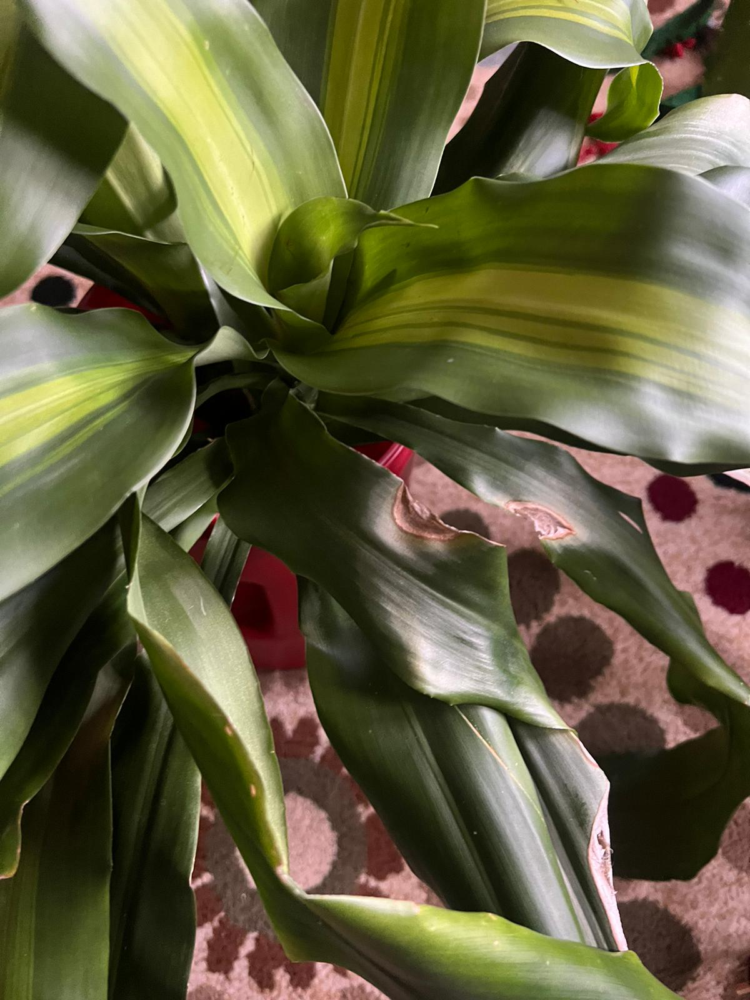

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 26.098192%


In [19]:
# Now, let's import an image as if we just received it from the arduino

img_path = 'D:/Rutgers/ExtraProjects/HackPrinceton23/HackPrinceton23/Test Images/Corn1.jpg'

# Open the image
img = Image.open(img_path).convert("RGB")
display(img)
img = transform(img)

prediction = DiseasePredictor(img.to(device).unsqueeze(0))
probabilities = F.softmax(prediction, dim=1)
predicted_probability, predicted_classes = probabilities.max(1)
predicted_classes = predicted_classes.item()
plant_type, disease_status = idx_to_class[predicted_classes]
predicted_probability = predicted_probability.item()*100

print("Plant Type: ", plant_type)
print("Disease Status: ", disease_status)
print(f'Confidence in Disease Assesment: {predicted_probability:.6f}%')

In [17]:
df[df['plant_name'] == plant_type]

,plant_name,temp_low,temp_high,humidity_low,humidity_high,sunlight,low_moisture_percent,high_moisture_percent
13,Tomato,21,29,40,70,5,6,8


### Here we will use opencv to take images and run it through the predictor

In [5]:
import cv2
import torch
import torch.nn.functional as F
from torchvision import transforms
from PIL import Image
import time

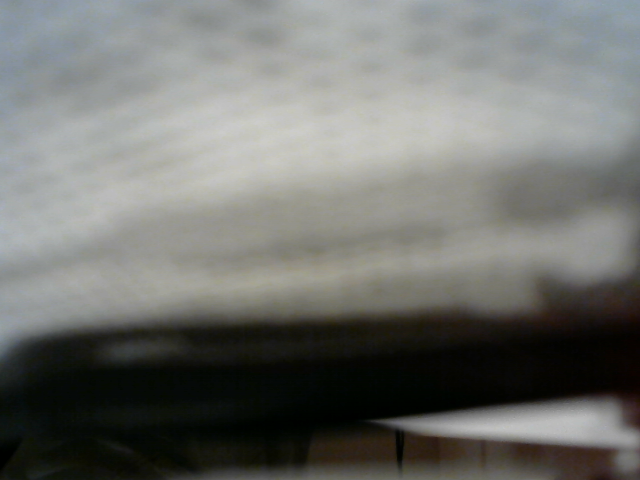

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 41.740930%


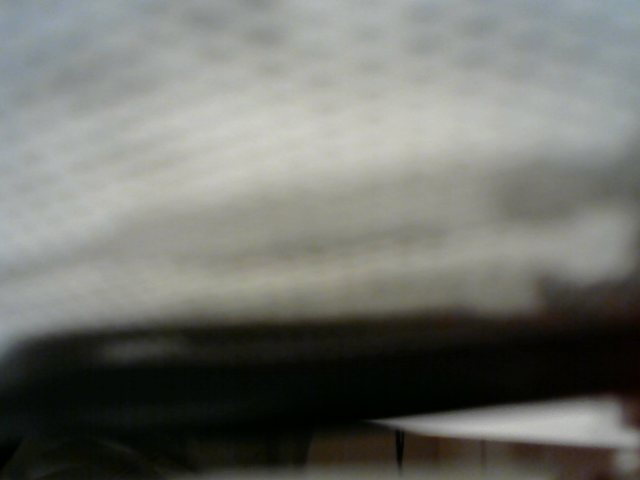

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 41.346049%


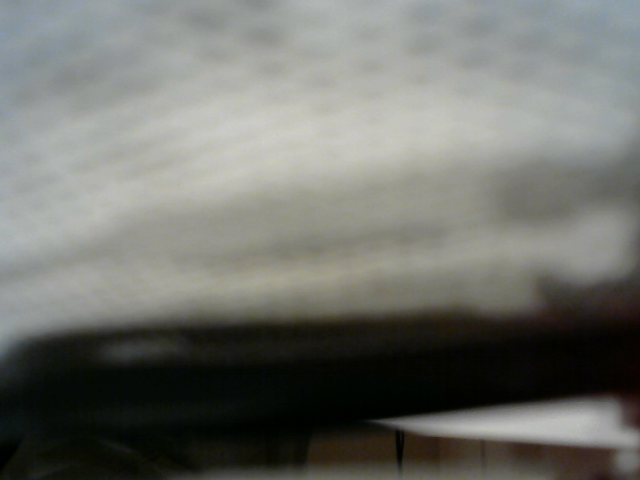

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 47.719651%


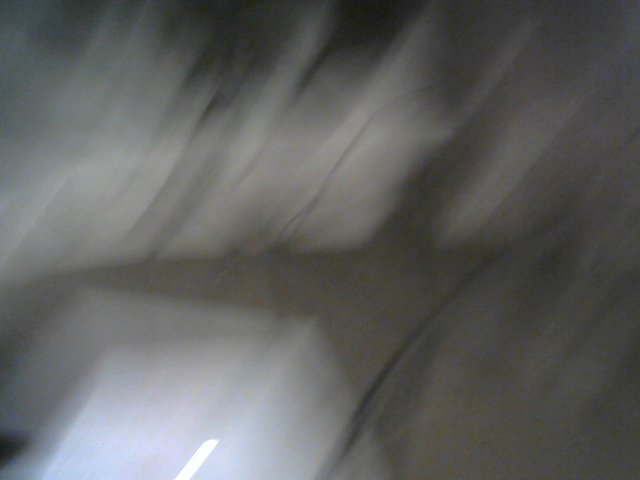

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 20.636399%


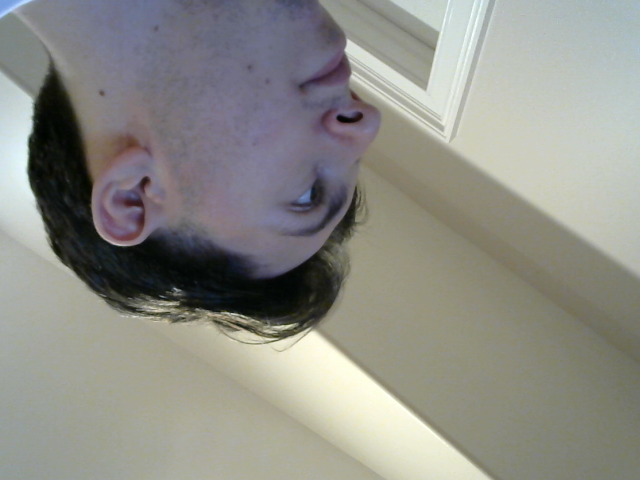

Plant Type:  Tomato
Disease Status:  Early Blight
Confidence in Disease Assesment: 18.312623%


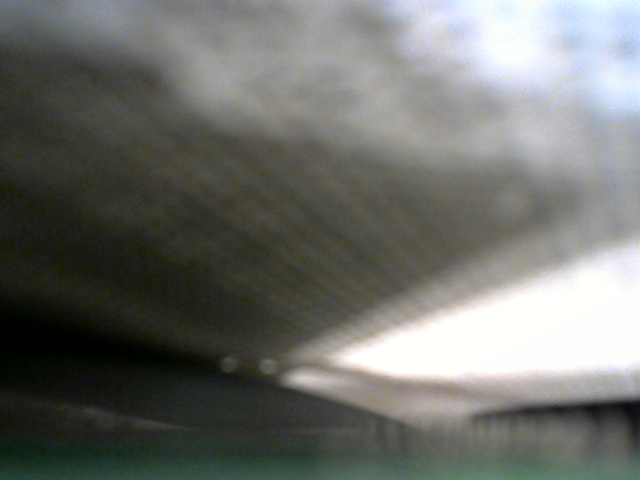

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 16.709682%


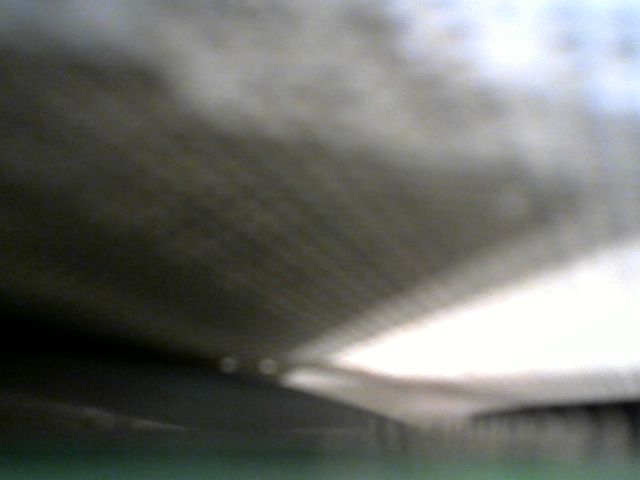

Plant Type:  Corn
Disease Status:  Healthy
Confidence in Disease Assesment: 22.880945%


KeyboardInterrupt: 

In [6]:

# Open a connection to the camera (0 represents the default camera)
cap = cv2.VideoCapture(0)

# Define a transformation to preprocess the image before feeding it into the model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),  # Assuming your model expects images of size (224, 224)
    transforms.ToTensor(),
])

for i in range(10):
    # Capture a frame
    ret, frame = cap.read()

    # Display the captured frame
    # cv2.imshow('Camera Feed', frame)

    # Convert the OpenCV BGR image to RGB
    rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(rgb_frame))

    # Apply the defined transformations
    input_tensor = transform(rgb_frame)
    input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension

    # Move the input tensor to the same device as the model
    input_tensor = input_tensor.to(device)

    # Forward pass through the model
    with torch.no_grad():
        prediction = DiseasePredictor(input_tensor)

    probabilities = F.softmax(prediction, dim=1)
    predicted_probability, predicted_classes = probabilities.max(1)
    predicted_classes = predicted_classes.item()
    plant_type, disease_status = idx_to_class[predicted_classes]
    predicted_probability = predicted_probability.item()*100

    print("Plant Type: ", plant_type)
    print("Disease Status: ", disease_status)
    print(f'Confidence in Disease Assesment: {predicted_probability:.6f}%')


    # Wait for a key press and check if it's the 'q' key to exit the loop
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

    time.sleep(5)

# Release the camera and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()


### Now, let's create a sript that will take pictures for 10 seconds continuously and then make a final determination of the plant and potential diseases 

In [1]:
import pickle

data = ["Healthy", 67.84, "44", "89", "233", "400"]
file = open('Test Images/newdata.txt', 'wb')

# dump information to that file
pickle.dump(data, file)

# close the file
file.close()

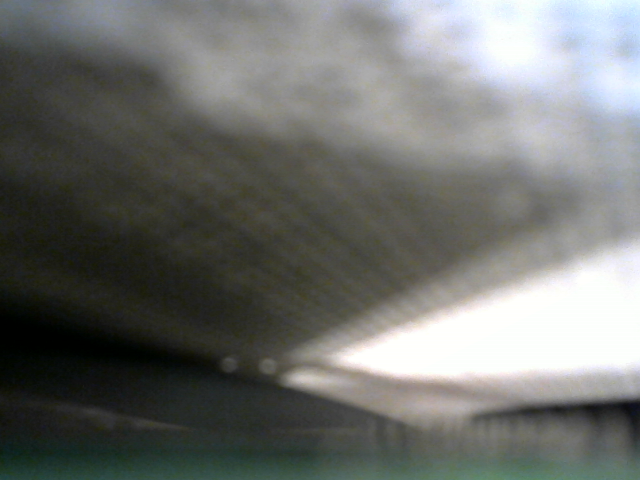

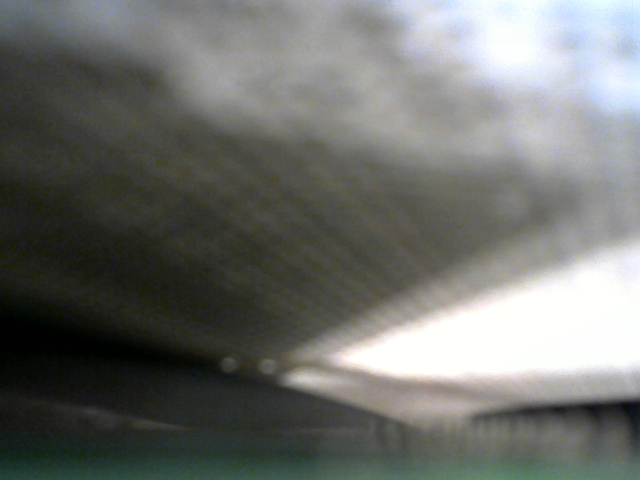

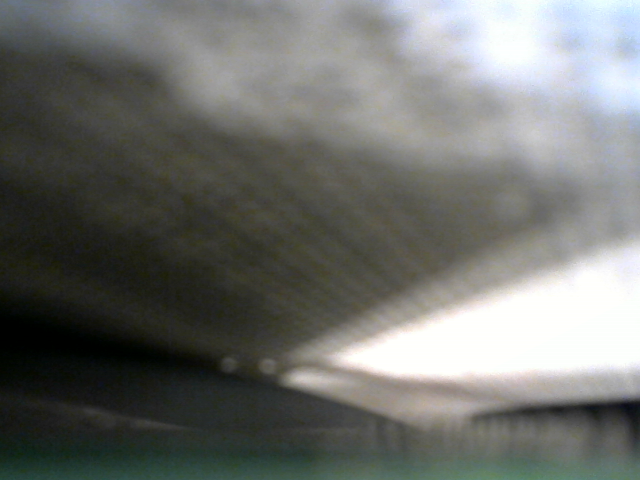

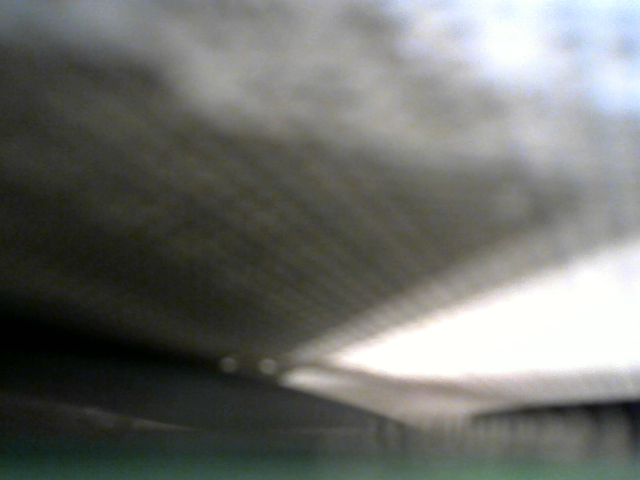

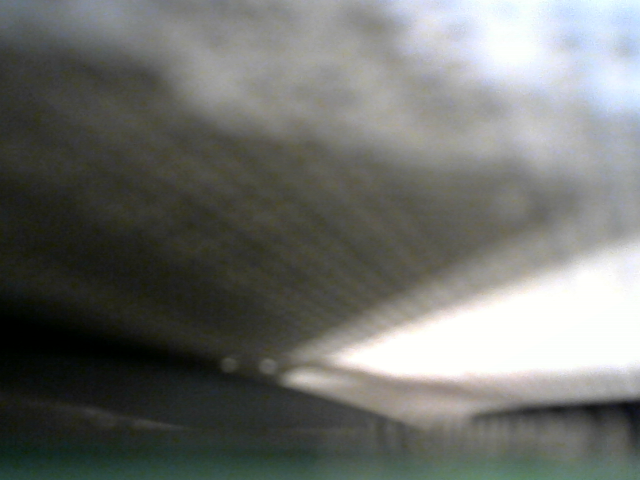

...

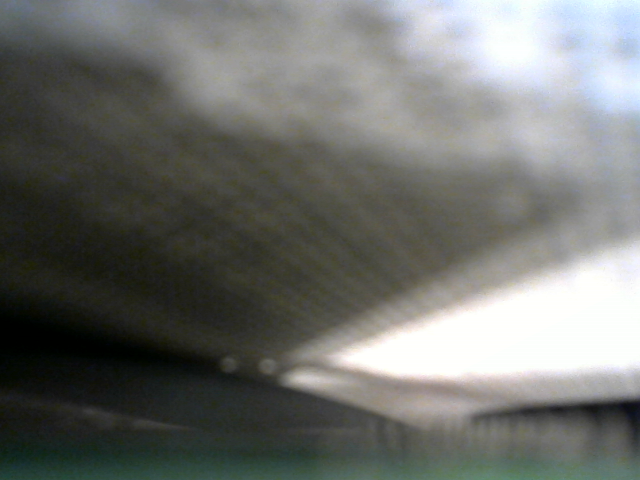

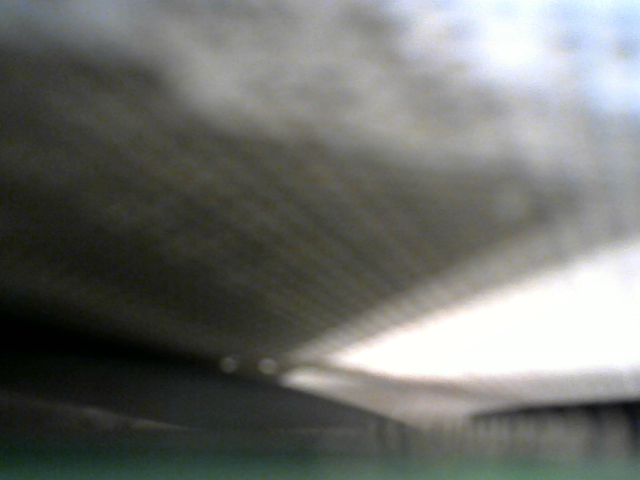

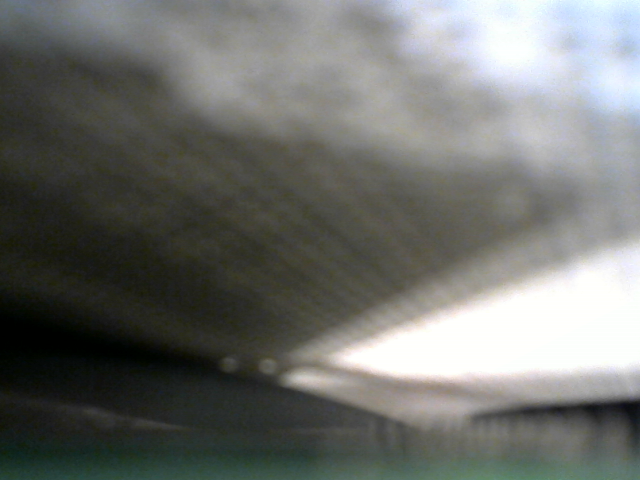

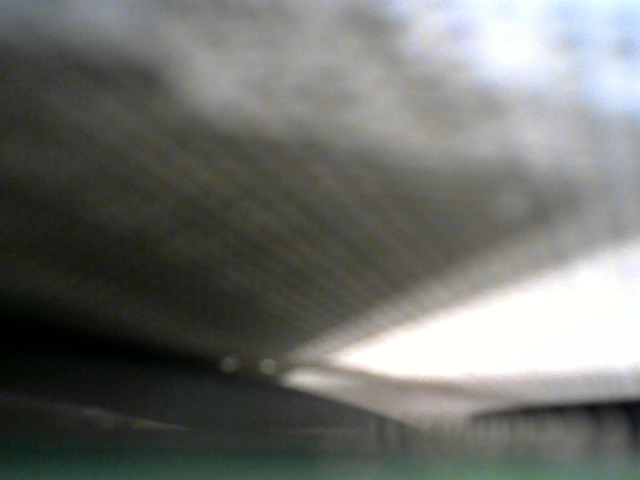

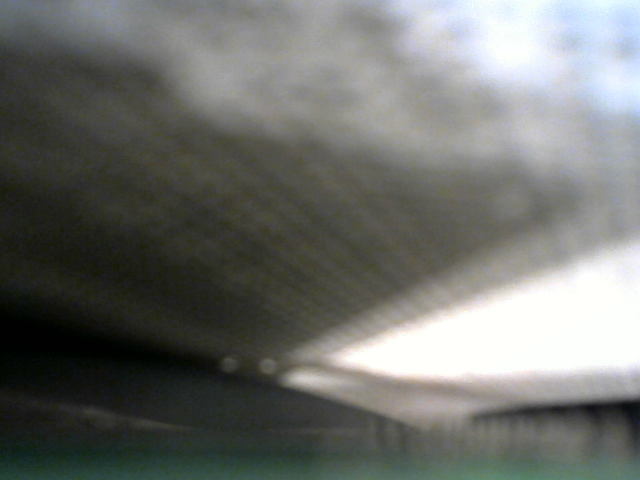

Final Decision:
Plant Type:  Apple
Disease Status:  Cedar Apple Rust
Average Confidence in Disease Assessment: 82.367550%


In [7]:

# Open a connection to the camera (0 represents the default camera)
cap = cv2.VideoCapture(0)

# Define a transformation to preprocess the image before feeding it into the model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),  # Assuming your model expects images of size (224, 224)
    transforms.ToTensor(),
])

# List to accumulate predictions
predictions = []

# Time duration for capturing photos (in seconds)
capture_duration = 20

# Record the start time
start_time = time.time()

try:
    while time.time() - start_time < capture_duration:
        # Capture a frame
        ret, frame = cap.read()

        # Convert the OpenCV BGR image to RGB
        rgb_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        display(Image.fromarray(rgb_frame))

        # Apply the defined transformations
        input_tensor = transform(rgb_frame)
        input_tensor = input_tensor.unsqueeze(0)  # Add batch dimension

        # Move the input tensor to the same device as the model
        input_tensor = input_tensor.to(device)

        # Forward pass through the model
        with torch.no_grad():
            prediction = DiseasePredictor(input_tensor)
        
        probabilities = F.softmax(prediction[:, 7:11], dim=1)
        predicted_probability, predicted_classes = probabilities.max(1)
        predicted_classes = predicted_classes.item()
        plant_type, disease_status = idx_to_class[predicted_classes]
        predicted_probability = predicted_probability.item() * 100

        # Store the prediction in the list
        predictions.append((plant_type, disease_status, predicted_probability))

        # Sleep for a short duration before capturing the next frame
        time.sleep(1)

except KeyboardInterrupt:
    # Handle KeyboardInterrupt (e.g., when the user interrupts the cell execution)
    pass

finally:
    # Release the camera
    cap.release()
    cv2.destroyAllWindows()

# Analyze accumulated predictions
if predictions:
    # Calculate the average confidence and make a final decision
    avg_confidence = sum(p[2] for p in predictions) / len(predictions)
    final_decision = max(predictions, key=lambda x: x[2])  # Choose the prediction with the highest confidence

    print("Final Decision:")
    print("Plant Type: ", final_decision[0])
    print("Disease Status: ", final_decision[1])
    print(f'Average Confidence in Disease Assessment: {avg_confidence:.6f}%')
else:
    print("No predictions were made.")
